<a href="https://colab.research.google.com/github/marekadamczyk44/ml_uwr/blob/main/Lectures/07-notes-dt.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Machine Learning @ UWr 2021

**Lecture 08**

## Decision Trees: Categorical splits

So far, we have seen how to implement a split over a continuous variable: the splitting criterion compares an attribute's value to a threshold. The best split is selected by considering all possible thresholds.

Discrete variables can be handled in an even simpler way: we simply introduce a subtree for all possible values an attribute may take.

Let's see this in action!

We will use a dataset about mushrooms: the task is to categorize each mushroom into an **e**dible or **p**oisonous one based on several discrete attributes.

In [10]:
mushroom_df.head()

,target,cap-shape,cap-surface,cap-color,bruises?,odor,gill-attachment,gill-spacing,gill-size,gill-color,...,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
0,p,x,s,n,t,p,f,c,n,k,...,s,w,w,p,w,o,p,k,s,u
1,e,x,s,y,t,a,f,c,b,k,...,s,w,w,p,w,o,p,n,n,g
2,e,b,s,w,t,l,f,c,b,n,...,s,w,w,p,w,o,p,n,n,m
3,p,x,y,w,t,p,f,c,n,n,...,s,w,w,p,w,o,p,k,s,u
4,e,x,s,g,f,n,f,w,b,k,...,s,w,w,p,w,o,e,n,a,g


We can see that a shallow tree is sufficient to categorize all mushrooms, with the most information provided by the `odor` column.

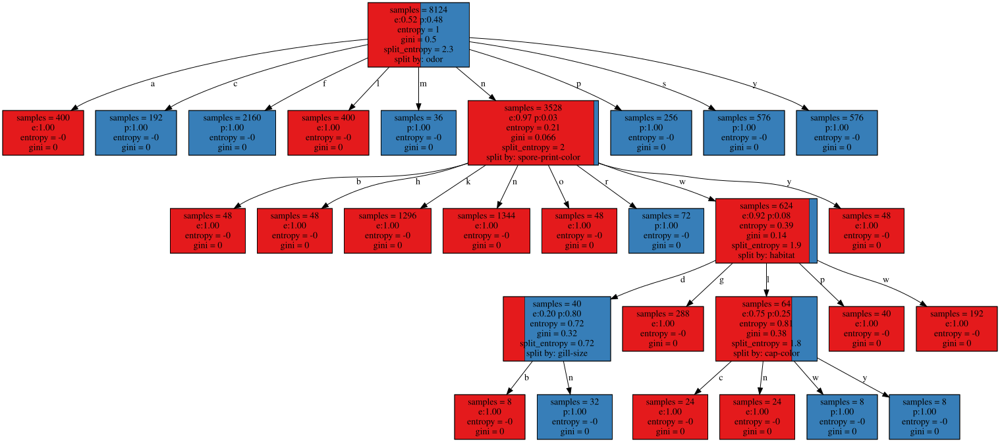

In [11]:
tree = Tree(mushroom_df, criterion="infogain")
tree.draw()

### InfoGain ratio or the danger of multiway splits

The mutual information can be large for splits on features that have multiple values. In an extreme case, splitting on a column with unique values, such as the row index, will create one-element subtrees which are trivially pure.

This follows directly from the properties of mutual information. Let $T$ be the target and $A$ an attribute. Recall that

$$
H(T) = I(T;A) + H(T|A) 
$$

and that all the quantities are non-negative. If $A$ takes many values all the subtrees will be small, and possibly pure. In the extreme case in which $A$ has a unique value for each data sample, $H(T|A)=0$ because knowing $A$ determines the sample which deteremines its target.

Therefore, InfoGain (or mutual information) biases split selection towards  splits which result in many subtress.

One solution to this problem is to forbid multiway splits. However, this means that now each time we grow the tree we must perform an optimization over possible groupings of feature values. This is costly (though the Gini criterion allows faster search for subsets due to its structure). 

An alternative approach is to downweight multiway splits. This mechanism was introduced in the C4.5 tree algorithm by Quinlan. The intuition is as follows: the mutual information measures the amount of bits that the splitting attribute tells us about the target. However, we can also compute the information contained in the split itself To penalize multiway splits, we divide the mutual information by the entropy of the split. 


Let $T$ be a random variable denoting the target variable and $S$ a random variable indicating the split variable. Mutual information between $T$ and $S$ is
$$
I(T;S) = H(T) - H(T|S) = H(T) - \sum_s p(S=s) H(T|S=s)
$$

The entropy of the split variable is
$$
H(S) = -\sum_s p(S=s) \log p(S=s)
$$

The Mutual Information Ratio, or Information Gain Ratio is defined as
$$
IGR(T,S) = \frac{I(T;S)}{H(S)}
$$
we divide the information learned about the target when given the splitting atribute, by the information needed to specify the split outcome. Splits which result in many tiny subtress need more bits to specify the subtree and are downweighted.

In [12]:
# Buiding a tree with the infogain (mutual information) crterion on data with
# columns that have multiple vales is prone to multiway splits.
# Here the data have an index column - the resulting depth one tree is useless!
tree = Tree(mushroom_idx_df, criterion="infogain")
tree.draw()

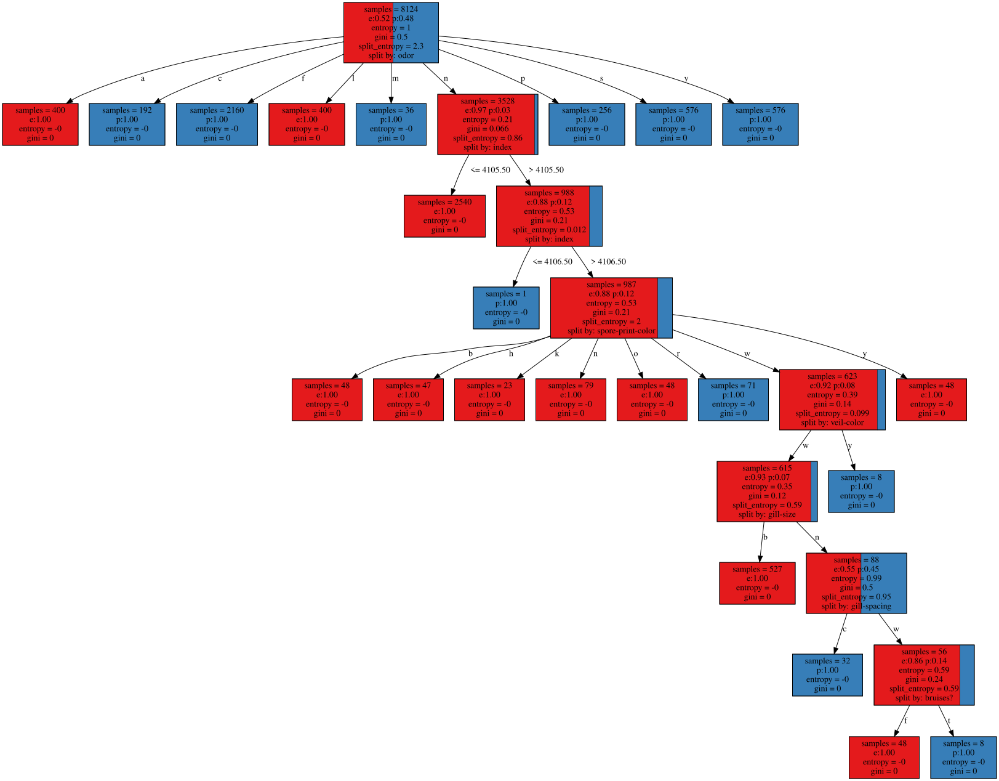

In [13]:
# Downweighting multiway splits performed by the infogain criterion ignores
# The index attribute, building a more useful tree.
tree = Tree(mushroom_idx_df, criterion="infogain_ratio")
tree.draw()

### Decision Trees and real data

Consider the following small dataset:

|  $F_1$ |  $F_2$ | $F_3$ | $F_4$ |
|:------:|:------:|-------|-------|
|  white |  tall  | 0.1   | 20    |
|   ??   |  short | -2    | 41    |
|   red  | medium | 1.7   | 15    |
| orange |  tall  | 203   | ??    |

It has four features:
- $F_1$ is discrete (cateorical) and the categories hove no particular ordering,
- $F_2$ is discrete and ordered,
- $F_3$ is numerical.
- $F_4$ is numerical.

The data also have problems:
- $F_1$ and $F_4$ have missing values (indicated by `??`),
- $F_3$ possibly has outliers.

A practical learning algorithm should be able to deal with all these problems!
Decision Trees are no exception and are fairly robust:
- categorical variables are handled using multiway splits
- continuous variables are handled using threshold splits. These are only sensitive to the ordering of the samples, do not require normalization and, like all rank-based statistics, are robust to outliers
- ordinal variables can be treated like discrete ones and induce a multiway split or like contonuous variables, where a threshold is used.

Several strategies exist to handle missing values:
1. Each node can be extended with a substitute splitting criterion, used when the main split feature is unknown.
2. A default child can be used (this corresponds to a constant substitute split).
3. All subtrees can be evaluated, and their results averaged with weights proportional to their sizes. Intuitively, this procedure virtualy replicates the sample, weighting each replica by the frequency of the assigned value of the missing feature. This corresponds to computing the expectation over the distribution of the splitting feature estimated at the current node. Thus it corresponds to a contextual missing value imputation (replacement).

Finally, we observe that decisin trees perform an intrinsic important feature selection. Depending on the data, this may be seen as a feature or a bug:
- if the data contains a small set of features that determines the result, decision trees will most likely identify them, producing a classifier that disregards all other ones
- if the data requires that decisions be made by accumulating contributions from many noisy features, decision trees will usually work poorly: trees that use many features must be deep, and deep trees run into the small data problem: nodes choose their splits based on little data, which causes overfitting.

We will first look at tree pruning, or techniques designed to reduce the heigth of trees without impacting their performnce. We will then see how tree forests can alleviate problems with incorporating many weak signals.



### Decision Trees for regression

While these notes concentrate on classification tasks, decision trees can equally well be used for regression. A suitable purity measure, such as the standard deviation of samples within each node can be used to select splits. Leaves then return the mean value.


## Decision Tree evaluation and pruning

If no two samples have conflicting labels, a sufficiently deep decision tree will perfectly split the training set. However, as the tree grows, nodes contain very little data. Class distributions computed on these small nodes are noisy, and it is often possible to remove several nodes from a tree without affecting its performance. Thie procedure is called _tree pruning_.

It may seem wasteful to first grow a tree, and only then prune it. However, stopping tree growth is difficult if several variables are jointly needed to classify the data. In such cases several splits look badly, and only after all required variables are in the tree the data is separated. This is simliar to the problem of variable selection: if two variables interact, the effect of a single one may be negligible, and an early stopping algorithm may be tempted to stop prematurely. Therefore it is desirable to fully grow trees, and then walk up from the leaves pruning nodes.

We will first see an example, and then learn how exactly pruning can be performed.

Recall the tree build for the Iris data. Its decision boundary is complicated because it must outline the two versicolors which lie close to the setosas.

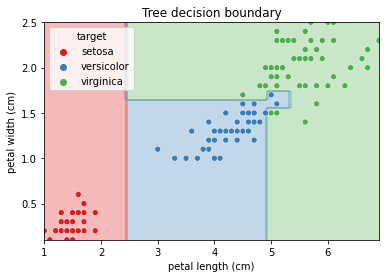

In [14]:
# Dec tree for 2D Iris
iris2d_tree = Tree(iris2d, print_info=False)
draw_tree_boundary(iris2d_tree)

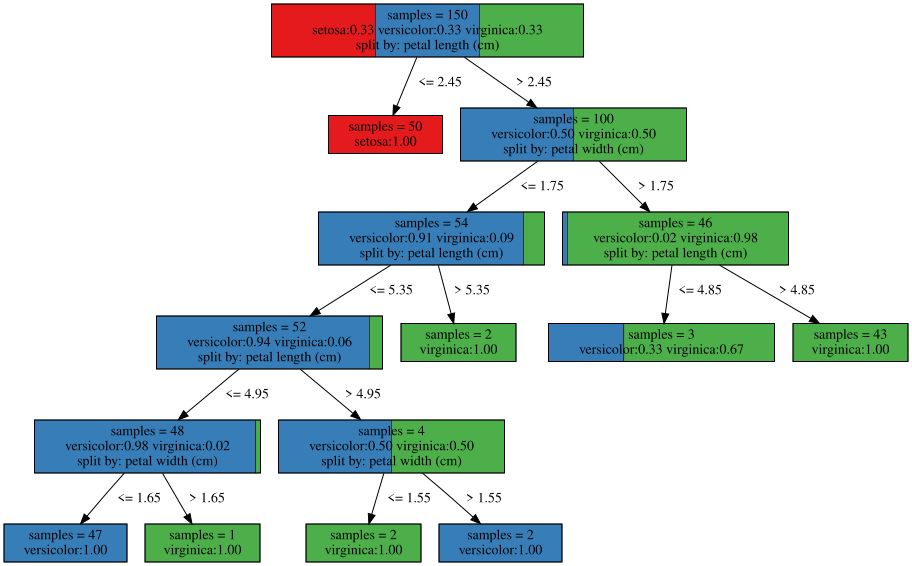

In [15]:
iris2d_tree.draw()

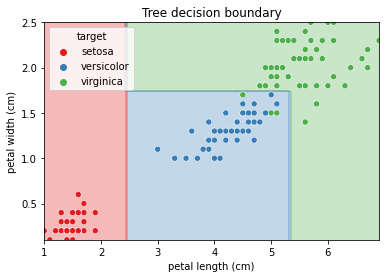

In [16]:
compute_pessimistic_err_rates(iris2d_tree, prune=True, alpha=0.00001)
draw_tree_boundary(iris2d_tree)

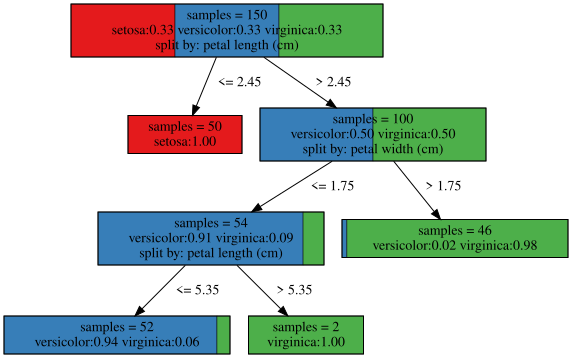

In [17]:
iris2d_tree.draw()

We can notice that the new tree is smaller, and makes a few trainig errors. Since the data is noisy near the boundary, we may prefer the smaller tree hoping that it would generalize better. In other words, we are regularizing it, enforcing a tree size prior: we preffer smaller trees.

We will now learn how pruning can be implemented. Let's first observe that training a decision tree can be seen as taking two decision:
1. Choose a **tree topology**, i.e. what splits to make, and how big is the tree.
2. Choose **node parameters**, e.g. the target distribution in each node.

Topology and parameters yield statistics, such as expected error rates.

The decision tree building algorithm performs the two steps jointly - each time it selects a split, it assigns some data to all subtrees and they determine on the parameters.




### Reduced Error Pruning

We could take an existing tree, remove its node parameters and then fit them based on some other data, then use yet another data to estimate error rates. This forms the basis of _reduced error pruning_ (REP):
1. Train a tree on all data
2. Erase node parameters
3. Split the data into a cross-validation subsets
4. For each cross-validation fold:
    1. Estimate node parameters using the training folds
    2. Compute error rates on the test fold

After this procedure each node has a cross-validated error rate. We then remove children whose error rates are larger than the ratees of their parents.

We will perform a simplified REP procedure below. We first train a tree on a voting data. We keep a small test set for final evaluation.


Err rate: 3.1% with 45 nodes


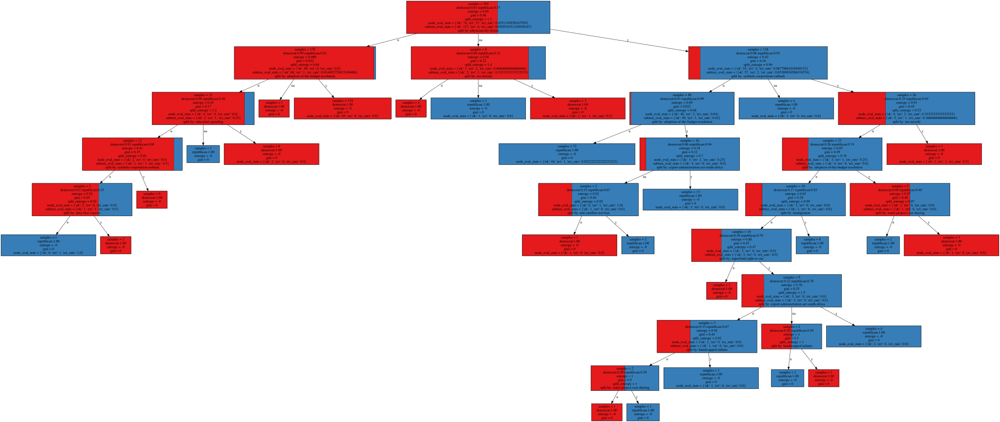

In [18]:
train_df, test_df = train_test_split(vote_df, test_size=0.3)

tree = Tree(train_df, criterion="infogain_ratio", print_info=True)

# Now score all test samples and print the error rate
correct = 0
for _, row in test_df.iterrows():
    correct += score(tree, row)
print(f"Err rate: {(1 - correct/len(test_df))*100:.2}% with {tree.size()} nodes")

tree.draw()

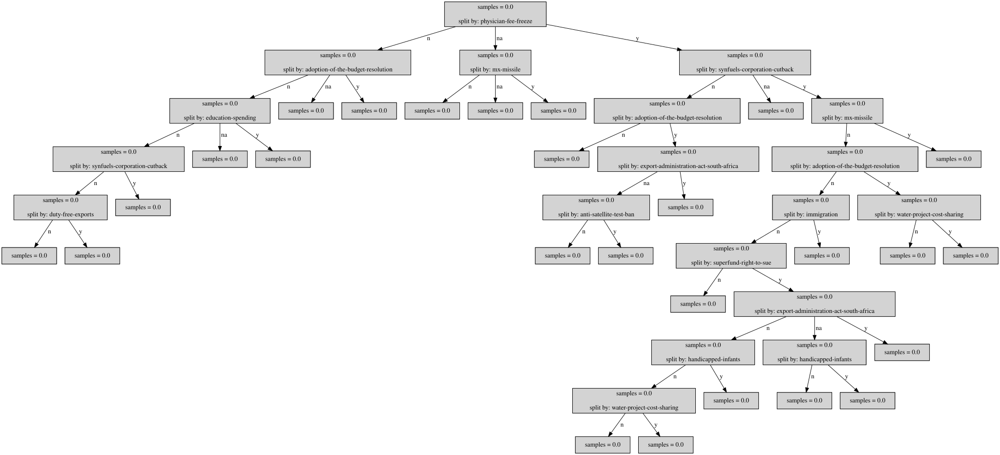

In [19]:
# This is the tree with zeroed counts
reset_counts(tree, reset_stats=True)
tree.draw()

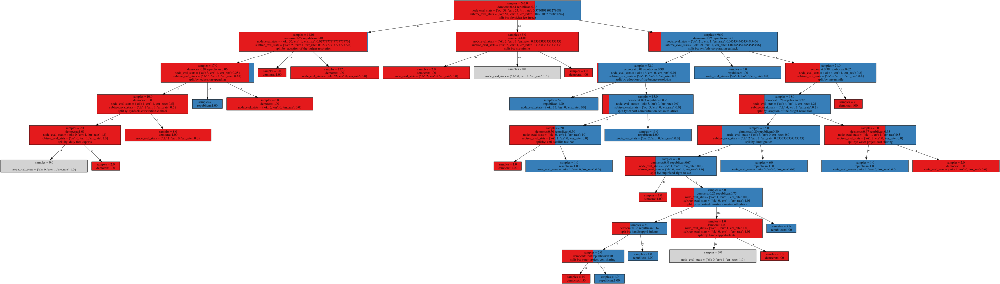

In [20]:
# Re-estimate node statistics: perform only one round, to show that some nodes are not reached.
for cv_train_idx, cv_test_idx in KFold(n_splits=5).split(train_df):
    for _, sample in train_df.iloc[cv_train_idx].iterrows():
        count_sample(tree, sample)
    for _, sample in train_df.iloc[cv_test_idx].iterrows():
        score(tree, sample)
    break
tree.draw()

Now run a 5-fold error estimation:



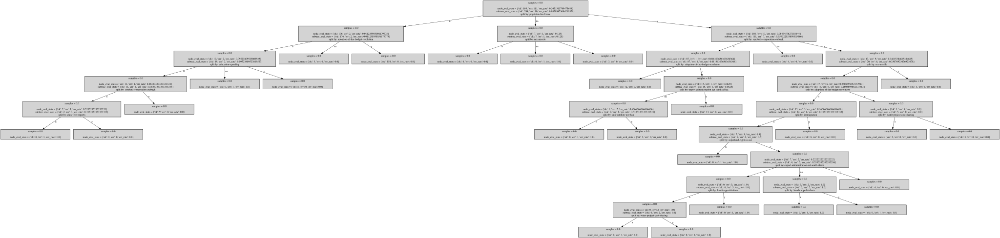

In [21]:
reset_counts(tree, reset_stats=True)

for cv_train_idx, cv_test_idx in KFold(n_splits=5).split(train_df):
    for _, sample in train_df.iloc[cv_train_idx].iterrows():
        count_sample(tree, sample)
    for _, sample in train_df.iloc[cv_test_idx].iterrows():
        score(tree, sample)
    reset_counts(
        tree, reset_stats=False
    )  # reset node counts, but keep the error statistics
tree.draw()

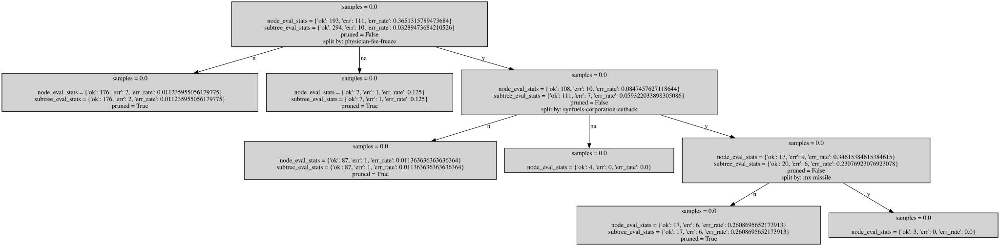

In [22]:
prune_rep(tree)
tree.draw()

Err rate: 4.6% with 9 nodes


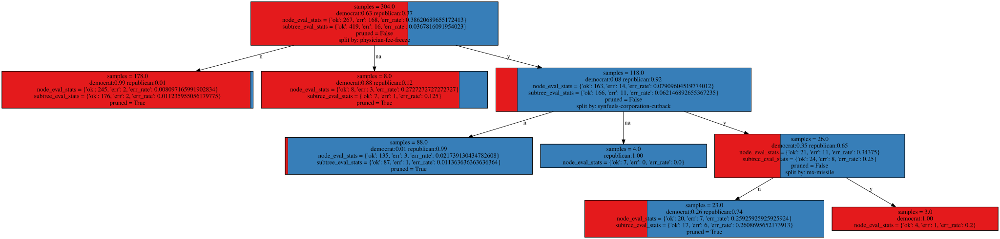

In [23]:
# Finally, reestimate the node parameters in the pruned tree based on the full
# train set
for _, sample in train_df.iterrows():
    count_sample(tree, sample)

# Now score all test samples and print the error rate
correct = 0
for _, row in test_df.iterrows():
    correct += score(tree, row)
print(f"Err rate: {(1 - correct/len(test_df))*100:.2}% with {tree.size()} nodes")

tree.draw()

The pruned tree is small and similarly accurate to the original one (depending on the train-test split it may be slightly better or worse).


### Confidence-interval based pruning

REP pruning is slow, because it requires several passes through the tree. An approximate procedure, based on confidence intervals was proposed by Quinlan for C4.5. It uses as similar strategy to REP: first build a large tree, then estimate node error rates and remove subtrees which look worse than their parents.

In confidence-interval based pruning we estimate a node's error rate using its confidence interval upper bound at a given confidence (typically 95%). Thus, nodes with very few samples which are pure by chance will look worse than nodes which classify many samples with a little error.

Let's retrain the tree on the Voting dataset and prune it using this technique!

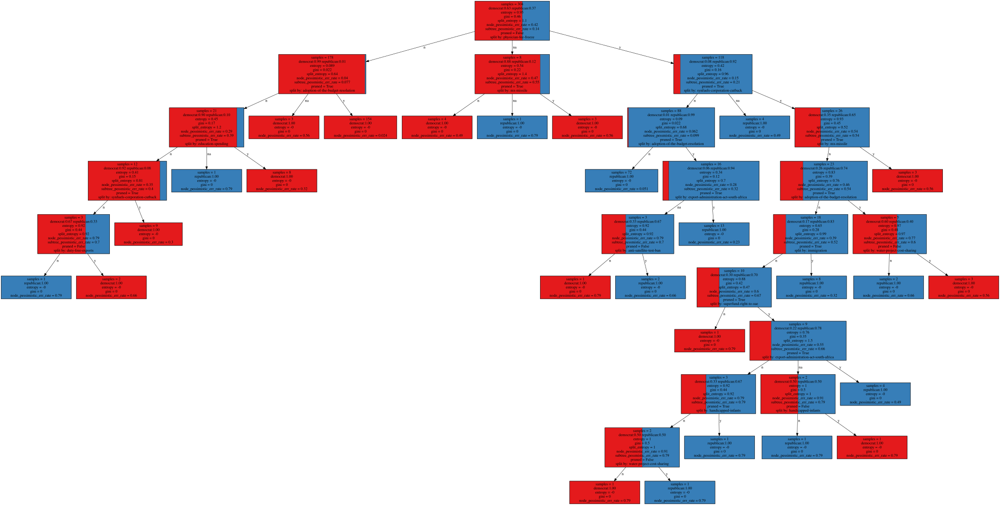

In [24]:
# Train again the tree
tree = Tree(train_df, criterion="infogain_ratio", print_info=True)

# Compute upper confidence bounds on error rates, mark nodes that would be pruned.
compute_pessimistic_err_rates(tree, prune=False, alpha=0.05)
tree.draw()

Err rate: 4.580152671755721% with 4 nodes


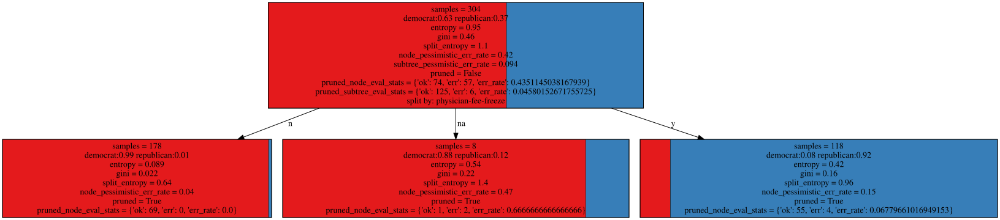

In [25]:
# Now prune the tree, then record the error rate on pruned tree
compute_pessimistic_err_rates(tree, prune=True, alpha=0.05)
correct = 0
for _, row in test_df.iterrows():
    correct += score(tree, row, prefix="pruned_")
print(f"Err rate: {(1 - correct/len(test_df))*100:2}% with {tree.size()} nodes")
tree.draw()

## From trees to forests

A single tree is a reasonable classifier: fast to train and moderately accurate. However, as we have argued earlier, trees have a problem to extract information out of many noisy variables.

However, ensembles of trees, that is models in which we average out the answer of many trees might fare better. Intuitively, an ensemble of trees would perform well, if two conditions are met:
1. the trees are fairly accurate by themselves,
2. the trees make uncorrelated errors.

How can we train many different trees for the same task? The tree building algorithm is deterministic. However, we can learn different trees by:
1. training on different subsets of the data,
2. inject randomness into the training process,
3. build trees sequentially, forcing each to act differently than the previous ones.

The first solution (applicable to all classifiers, not only trees) works quite well on its own. A praticular implementation that we will describe next is called [_bagging_](https://link.springer.com/article/10.1007/BF00058655). It works best with classifiers which are unstable, that is with classifiers which produce different results when started in similar conditions. This usually means, that models are lightly regularized: trees are not pruned, regresion models don't have weight penalties. Intuitively, regularization stabilizes classifiers, making them more self-similar.

Making classifiers non-deterministic is a powerful way to decorrelate their errors. Some algorithms are naturally non-deterministic. For instance neural networks solve an optimization problem with many local minimas and different results are naturally obtained when training is started at different initial points.
Decision trees use a deterministic (though unstable) training algorithm, and additional randomness is often introduced by making split selection less greedy. For instance, trees inside a Random Forest greedily select the best split from a small (sometimes just 1!) set of features.

Below we will describe a very powerful combination of dataset randomization (using bagging) with random trees called [Random Forest](https://link.springer.com/article/10.1023/A:1010933404324). In the next set of notes we will look at sequential ensemble building schemes, which force classifiers to make decorreleated training errors.





### Why Bagging may help?

Consider a set of $n$ i.i.d. random variables $X_i$.
Assume $\mathrm{Var}(X_i) = \sigma^2 $.
Then the variance of $\bar{X} = \frac{1}{N}\sum_{i=1}^N X_i$ is

$$
\mathrm{Var}(\bar{X}) = \mathrm{Var}\left(\frac{1}{N}\sum_i X_i\right) = \frac{\sigma^2}{N}.
$$

This result means, that averaging independent random variables yields a new variable with a lower spread. In Machine Learning, the $X_i$'s may be the errors of different classifiers (for regrssion problem, the MSE criterion corresponds to variance if the mean error is 0). Averaging the outputs of many independent classifiers gives a better classifier!

However, real classifiers will not makeindependent errors. After all, they are solving the same task, and should behave similarly. Let's model this by assuming that $X_i$ are correlated, with a factor $\rho$. What happens to their average?

$$
\begin{split}
\mathrm{Var}(\bar{X}) =& \mathrm{Var}\left(\frac{1}{N}\sum_i X_i\right) = \\ =& \frac{1}{N^2}\left(\sum_i \mathrm{Var}(X_i) + \sum_i\sum_{j\neq i} \mathrm{Cov}(X_i, X_j) \right) \\
=& \frac{1}{N^2}\left( N\sigma^2 + N\left(N+1\right)\rho\sigma^2 \right) \\
=& \rho\sigma^2 + \frac{1-\rho}{N}\sigma^2
\end{split}
$$

We see that a bagged classifier will have a small error (the variance of the mean error is small) if:
1. the individual classifiers have small errors => $\sigma^2$ small
2. the classifiers are maximally unorreleated => $\rho$ small

Bagging requires using base learners that are fairly accurate, but unstable - each run produces a different model. We will see below how this can be achieved.

### Classifier Bagging

Bagging employs a very simple approach to building models. Each model is obtained by:
1. Sampling a bootstrap training set: from a dataset of size N we sample with replacement N samples. The unselected samples are called out-of-bag and will be later used for performance estimation.
2. A classifier is built on the bootstrap training set.

After K rounds of bagging, the final prediction averages the outputs of the K classifiers.

Bagging provides an internal error estimator: the _out-of-bag_ error rate. In each round some samples are not selected for model training. We can put them through the model, and record the answers. When bagging ends, we average the out-of-bag decisions and compute the desired statistics.




In [26]:
def bootstrap_indices(df):
    N = len(df)
    train_idx = np.random.randint(0, N - 1, size=(N,))
    oob_idx = np.ones((N,), dtype=bool)
    oob_idx[train_idx] = 0
    oob_idx = np.where(oob_idx)[0]
    return train_idx, oob_idx

In [27]:
classify(iris2d_tree, iris2d.iloc[0])

'setosa'

OOB Err Rate from 100 trees: 4.7


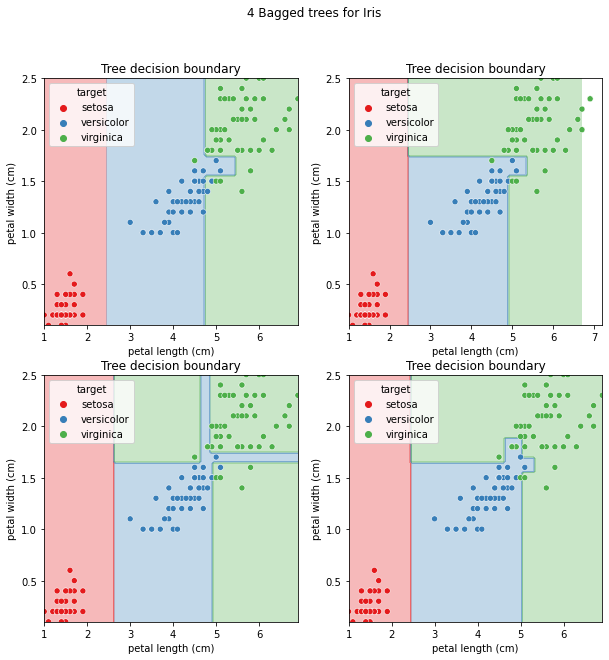

In [28]:
plt.figure(figsize=(10, 10))
plt.suptitle("4 Bagged trees for Iris")

K = 100
oob_vote_counts = [
    pd.Series(data=0, index=iris2d.target.unique()) for _ in range(len(iris2d))
]

all_trees = []
for r in range(K):
    train_idx, oob_idx = bootstrap_indices(iris2d)
    iris2d_tree = Tree(iris2d.iloc[train_idx], print_info=False)
    all_trees.append(iris2d_tree)
    for idx in oob_idx:
        prediction = classify(iris2d_tree, iris2d.iloc[idx])
        oob_vote_counts[idx][prediction] += 1

    if r < 4:
        plt.subplot(2, 2, r + 1)
        draw_tree_boundary(iris2d_tree)

oob_preds = [counts.idxmax() for counts in oob_vote_counts]
print(f"OOB Err Rate from {K} trees: {(iris2d.target != oob_preds).mean()*100.0:.2}")

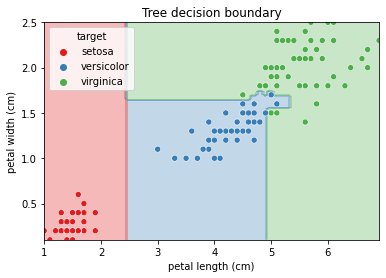

In [29]:
draw_tree_boundary(*all_trees)

We can see that the trees are indeed different in the transition zone between versicolor and virginicas. However, they also very similar, for instance the first split is always along the petal length.

Forcing the tree to select to randomly select the splitting feature, then optimize the threshold introduces more variability. Additionally, growing trees is cheaper, because fewer features are considered for each split.

OOB Err Rate from 100 trees: 5.3


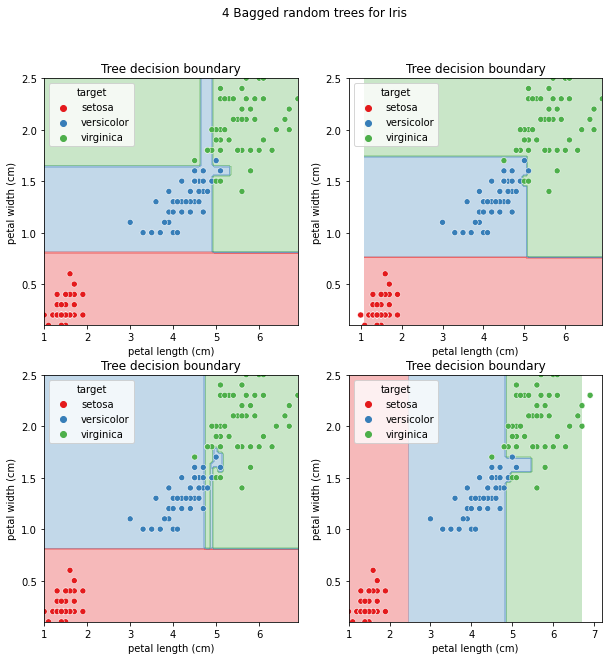

In [30]:
plt.figure(figsize=(10, 10))
plt.suptitle("4 Bagged random trees for Iris")

K = 100
oob_vote_counts = [
    pd.Series(data=0, index=iris2d.target.unique()) for _ in range(len(iris2d))
]

all_trees = []
for r in range(K):
    train_idx, oob_idx = bootstrap_indices(iris2d)
    # Crucial change: nattrs controls the number of attributes considered for each split
    iris2d_tree = Tree(iris2d.iloc[train_idx], print_info=False, nattrs=1)
    all_trees.append(iris2d_tree)
    for idx in oob_idx:
        prediction = classify(iris2d_tree, iris2d.iloc[idx])
        oob_vote_counts[idx][prediction] += 1

    if r < 4:
        plt.subplot(2, 2, r + 1)
        draw_tree_boundary(iris2d_tree)

oob_preds = [counts.idxmax() for counts in oob_vote_counts]
print(f"OOB Err Rate from {K} trees: {(iris2d.target != oob_preds).mean()*100.0:.2}")

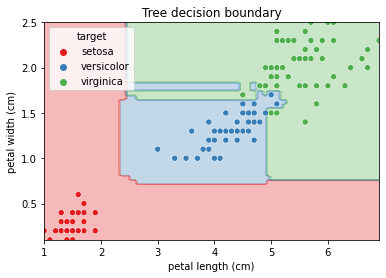

In [31]:
draw_tree_boundary(*all_trees)

We can see that the randomized trees have more varied decision boundaries than the bagged greeedy ones. However, the individual trees remain strong. This causes the Random Forest classifier to perform exceptionally well.

The Random Forest is a very versatile classifier, and often a good first choice in initial data exploration:
1. It has only two hyperparameters:
    * Number of trees in the forest. This parameter is not too critical. Large forests are slower but don't overfit, thus one can add trees until the performance saturates.
    * Number of random attributes considered at each split. This is a critical, data-dependent parameter. Choosing the split from a small (even 1) number of features will decorreleate more the trees, but on datasets with many noisy, spurious variables will not be filtered out. On the other hand, setting it to a large number will make the tree building algorithm more greedy, and the trees more correlated. A good starting point is $\sqrt{\text{num features}}$.

2. Random Forest is resilient to data pathologies. Just like regular Decision Trees, it handles different attribute types, missing values and outliers.

  Random Forests can handle datasets with more features than data samples - this is challenging, because the problem is inherently ill-posed, because we have more degrees of freedom (more parameters) than constraints (data samples).

3. Random Forests can give confidence intervals and prediction probabilities - simply return the uncertainty of the votes of the ensemble.

4. Random Forest offers an internal error rate estimator, the out-of-bag error rate. It is an unbiased bootstrap estimate of the generalization error rate.

  Moreover, the OOB error can indicate us training data label confidence (samples with ambiguous OOB errors may be near the decision boundary) and outliers.

5. Random Forests offers decent variable importance measures. 

  A quick way to estimate a variable's importance is to compute the mean purity increase over all splits that involve this variable in the forest.

  A better, but more computationally involved importance measure the change of forest outputs when a feature's values are randomized. E.g. it is common to shuffle data in the attribute's column. By design, a RF explores how various combinations of features correlate with the target, the randomness helps it to escape always selecting the same features.

6. Random Forest offers a similarity measure for the data.
  
  Each tree in the forest can be seen as a function mapping data samples to nodes. Two data samples that are often belong to same nodes are similar.

  This similarity measure can sometimes be learnt without any labels, by solving a pseudo-task. One can, for instance prepare an artificial dataset by randomizing all attributes. A Random Forest is then trained to detect fake data from the original. The resulting forest yields variable importance metrics and data similarity measures.


